## Отчет:

Было реализовано четыре модели:
- Fully Convolutional Networks (FCN):
- SegNet
- UNet
- Unet with ResNet34 encoder

Самой эффективной оказалась UNet и Unet with ResNet34 encoder исходя из анализ метрик. Другие модели не показали хороших результатов за сравнительно адекватное время. Именно поэтому сравним результаты именно этих архитектур.

**Пример тестовых данных на архитектуре UNet и Unet with ResNet34:**

In [1]:
import os

import cv2
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

from glob import glob

from lib import *

%matplotlib inline

**Unet vs Unet with ResNet34:**

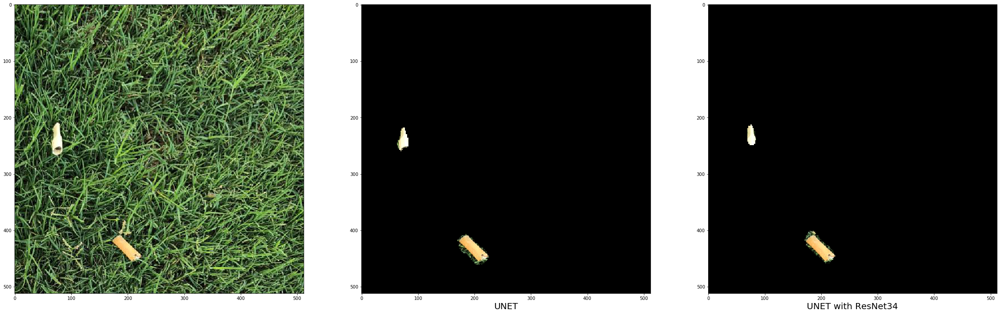

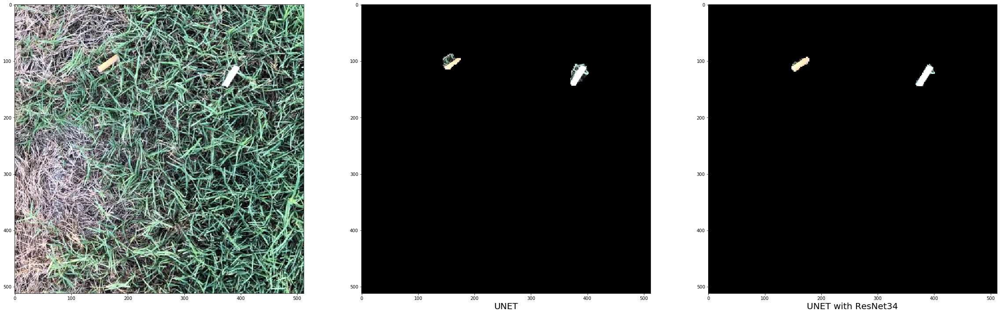

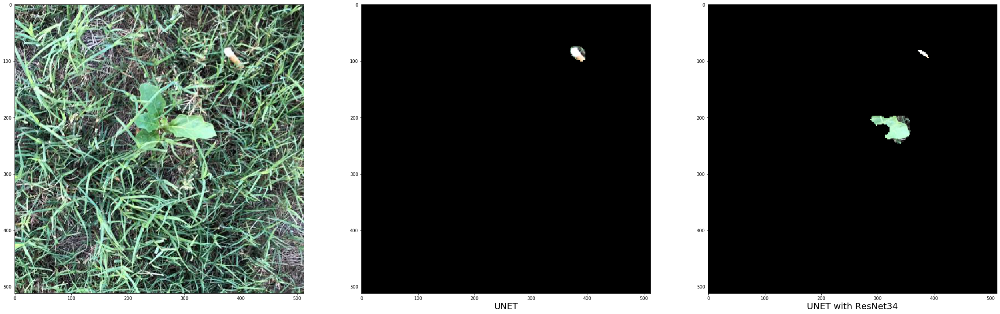

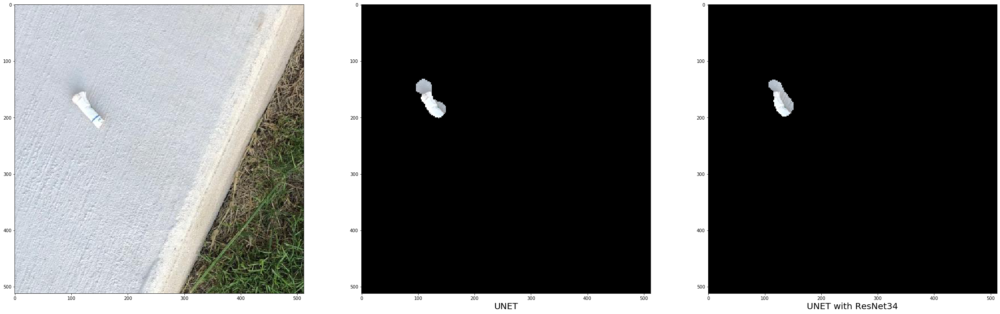

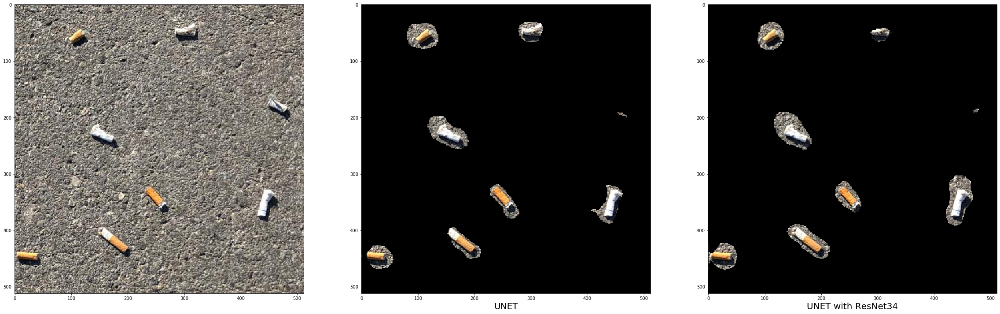

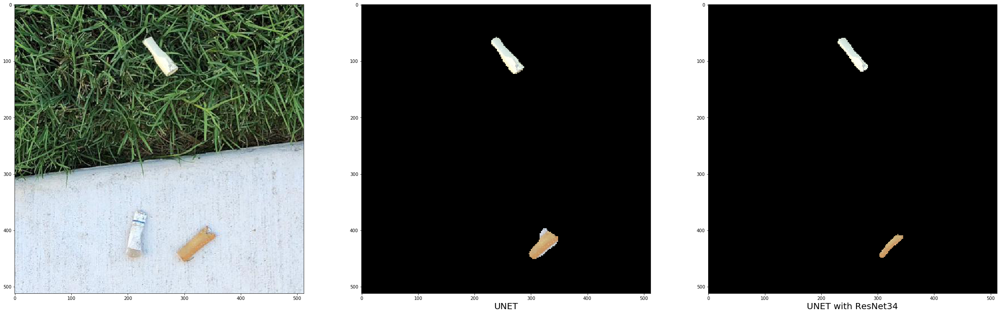

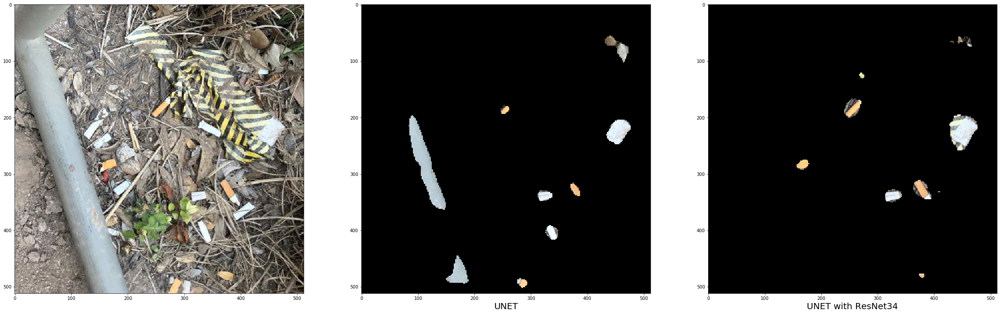

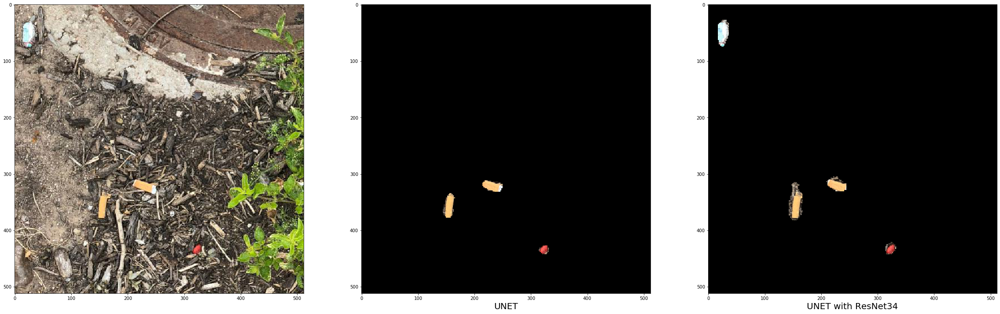

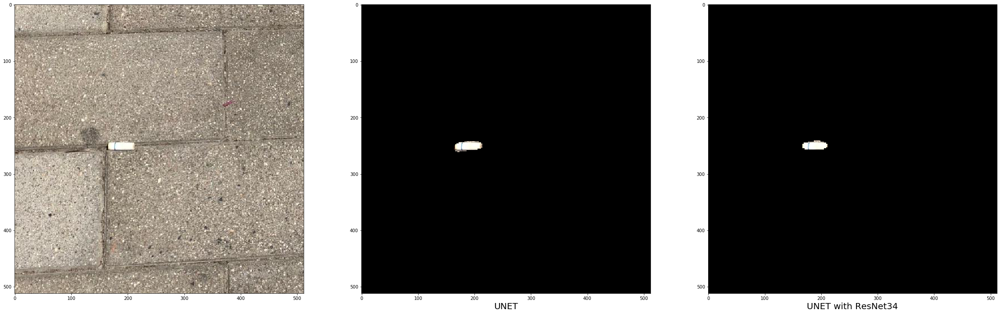

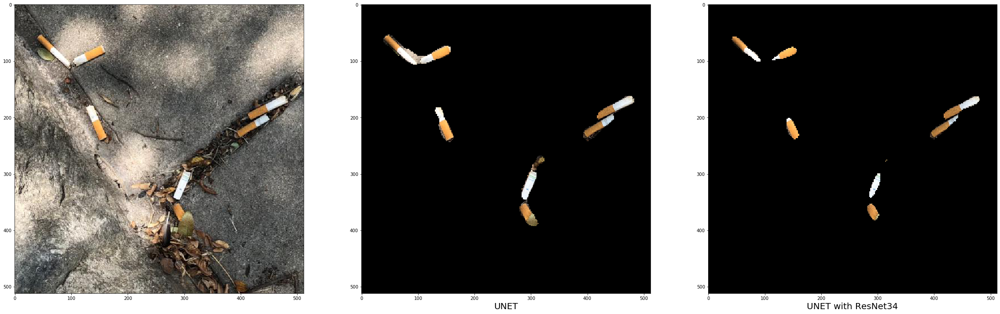

In [3]:
path = "results/examples"
path1 = "results/examples1"
images = os.listdir(f"{path}/images")
images1 = os.listdir(f"{path1}/images")
img_id = 1

for i in range(10):
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(40, 40))
    img_id = i
    img1 = np.array(Image.open(f"{path}/images/{img_id:04}_img.jpg"))
    img2 = np.array(Image.open(f"{path}/images/{img_id:04}_crop.png"))
    img3 = np.array(Image.open(f"{path1}/images/{img_id:04}_crop.png"))
    axes[0].imshow(img1)
    axes[1].imshow(img2)
    axes[1].set_xlabel('UNET', fontsize = 20)
    axes[2].imshow(img3)
    axes[2].set_xlabel('UNET with ResNet34', fontsize = 20)

Как мы видим в некоторых случаях окурки не опознаны (например на 6-ой картинке). Я считаю, чтобы улучшить результаты модели нужно увеличить количество фильтров и слоев в базовой модели UNet, но это решение упирается в вычислительные мощности. В других случаях архитектура показала себя довольно хорошо. В среднем эти две модели работают похоже и там где справилась одна справилась и другая, где не опознала UNet не опознала и UNet с модификацией.

In [4]:
pred1 = pd.read_csv("Unet_Best.csv")
a1 = pred1.rle_mask

pred2 = pd.read_csv("Unet_ResNet_Best.csv")
a2 = pred2.rle_mask



In [5]:
import random
z = random.randint(1,199)
ans=[]
index = []

In [6]:
for i in range(10):
    z = int(random.randint(1,199))
    if (type(a1[z])!=float):
        ans.append(get_dice(decode_rle(a1[z]),decode_rle(a1[z])))
        index.append(i)



Text(0, 0.5, 'val')

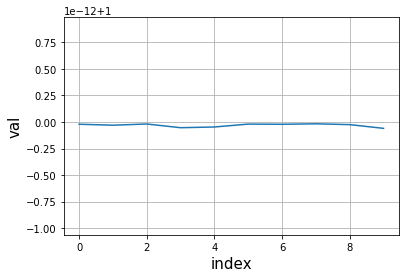

In [7]:
fig, ax = plt.subplots()

ax.plot(index, ans)
ax.grid()
ax.set_xlabel('index',
              fontsize = 15) 
ax.set_ylabel('val', fontsize = 15)

Их графика видно, что модели работают приблизительно одинаково и отклонение их результатов в пределах погрешностей вычислений.

**Анализ метрик:**

При подсчете метрик лучше всех себя показала архитектура Unet , получили такие значения:

get_dice(val_mask, predict_mask) = 0.547057133170104 - для Unet with ResNet34  
get_dice(y_val, ans) = 0.7698456802157996 - для UNet

что вполне себе неплохо, учитывая вычислительные мощности. Для улучшения результата нужно использовать модель с большим количеством слоев и фильтров. По-идее Unet with ResNet34 должна была показать лучший результат, loss у этой архитектуры падал быстрее чем у UNet. Я могу обьяснить это тем, что Unet обучался в два раза больше чем Unet with ResNet34 (около 9 часов).

**Результаты:**

In [8]:
pred = pd.read_csv("Unet_Best.csv")
pred.head()

,img_id,rle_mask
0,0,72540 4 73052 4 73562 10 74074 10 74584 14 750...
1,1,89768 8 90280 8 90790 12 91302 12 91812 16 923...
2,2,49910 2 50422 2 50930 10 51442 10 51952 12 524...
3,3,24304 8 24816 8 25320 20 25832 20 26340 24 268...
4,4,158526 2 159038 2 159544 10 160056 10 160566 1...


**Вывод:**

Обе модели показали себя достаточно хорошо, но в некоторых случаях они не способны распознать элемент. Для того, чтобы улучшить результат неообходимо строить более глубокие архитектуры.